In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
import sys
from IPython.display import display, Markdown

sys.path.append(os.path.abspath(os.path.join('..', 'src')))

from utils import plot_pairplot, calculate_stats, correlation_with_target
from preprocessing import handle_missing_values, one_hot_encoding, normalize_df
from data_splitting import train_validate_split
from models import LogisticRegression
from metrics import plot_conf_matrix, accuracy, precision, recall, f1_score, plot_pr_curve, plot_roc_curve
from balancing import undersampling, oversampling, smote

RANDOM_STATE = 42
TARGET = 'Diagnosis'

TRUE_INTERVALS = {
    'CellSize': (60, 80),
    'CellShape': (0.4, 0.58),
    'NucleusDensity': (1.2, 1.6),
    'ChromatinTexture': (20, 25),
    'CytoplasmSize': (20, 34.4),
    'CellAdhesion': (0.4, 0.6),
    'MitosisRate': (2.4, 4),
    'NuclearMembrane': (2, 2.8),
    'GrowthFactor': (52, 68),
    'OxygenSaturation': (78, 84),
    'Vascularization': (4, 6),
    'InflammationMarkers': (30, 50)
}

# Load the data
cell_diagnosis_dev_df = pd.read_csv('../data/raw/cell_diagnosis_dev.csv')

cell_diagnosis_dev_df.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType,GeneticMutation
0,63.423148,0.500594,1.473261,23.300222,NaN,0.477657,3.434832,2.492852,-10.000000,78.625935,5.727217,41.158399,0.0,Epthlial,Absnt
1,72.906362,0.474808,1.361360,21.336137,29.856233,0.481035,2.702433,2.281137,63.084699,NaN,5.319552,NaN,1.0,Epthlial,Presnt
2,70.711969,0.481701,NaN,21.521406,30.582427,0.472651,2.786606,2.318029,61.347022,NaN,NaN,NaN,1.0,???,Absnt
3,73.210206,NaN,1.427612,22.437077,29.887970,0.439511,2.998380,2.149232,64.047169,80.693058,NaN,37.843069,1.0,Mesnchymal,Presnt
4,68.348288,NaN,1.454116,21.150723,28.328197,NaN,2.987601,NaN,62.197197,81.737990,4.347438,43.444881,1.0,Epthlial,Presnt


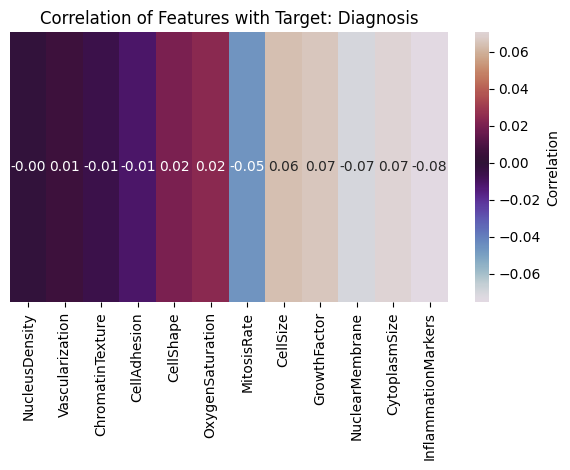

In [20]:
correlation_with_target(cell_diagnosis_dev_df, TARGET)

In [21]:
cell_diagnosis_dev_df_filled = handle_missing_values(cell_diagnosis_dev_df, true_intervals=TRUE_INTERVALS)

cell_diagnosis_dev_df_filled_OHE = one_hot_encoding(cell_diagnosis_dev_df_filled)

#save the cleaned data
cell_diagnosis_dev_df_filled_OHE.to_csv('../data/processed/cell_diagnosis_dev_cleaned.csv', index=False)

cell_diagnosis_dev_df_filled_OHE.head()


100%|██████████| 1573/1573 [00:01<00:00, 876.62it/s]


,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,63.423148,0.500594,1.473261,23.300222,26.849465,0.477657,3.434832,2.492852,60.148680,78.625935,5.727217,41.158399,0.0,1,0,0
1,72.906362,0.474808,1.361360,21.336137,29.856233,0.481035,2.702433,2.281137,63.084699,80.013376,5.319552,39.508947,1.0,1,0,1
2,70.711969,0.481701,1.434487,21.521406,30.582427,0.472651,2.786606,2.318029,61.347022,79.915954,5.084944,40.561055,1.0,0,0,0
3,73.210206,0.500044,1.427612,22.437077,29.887970,0.439511,2.998380,2.149232,64.047169,80.693058,5.043870,37.843069,1.0,0,1,1
4,68.348288,0.505199,1.454116,21.150723,28.328197,0.481932,2.987601,2.354617,62.197197,81.737990,4.347438,43.444881,1.0,1,0,1


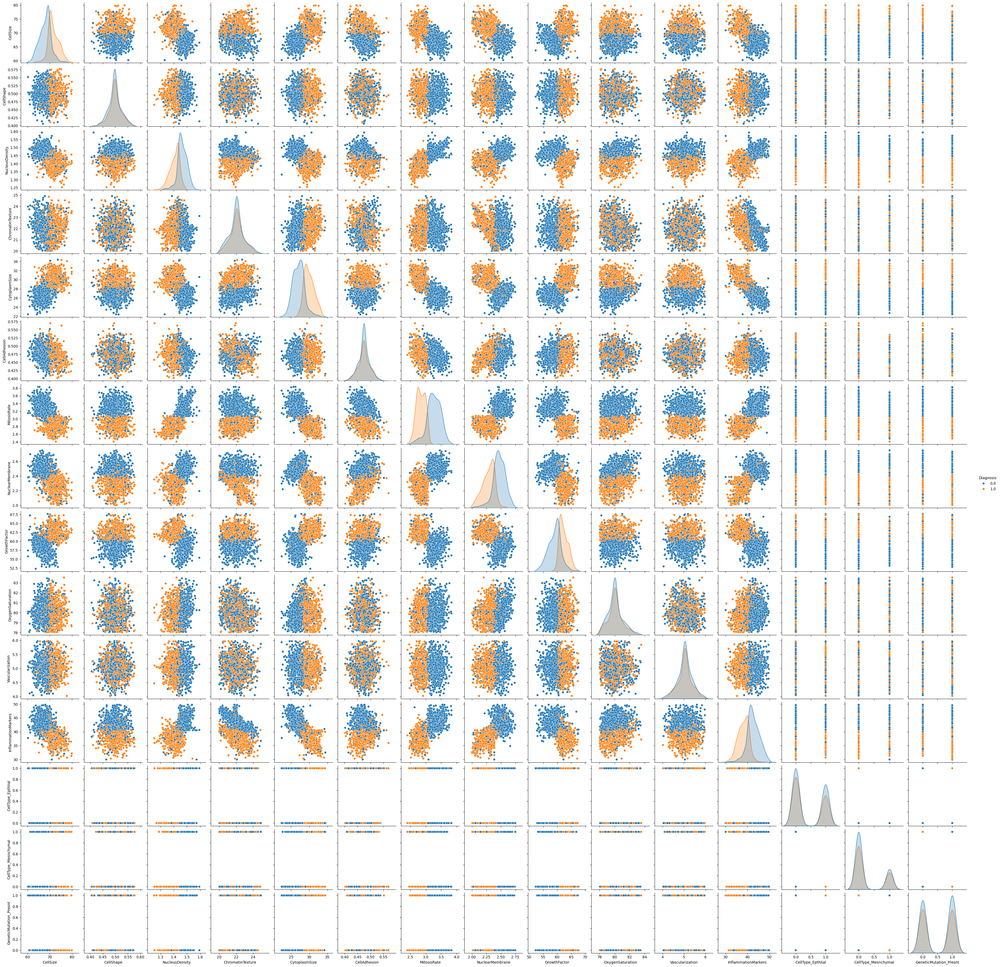

In [22]:
plot_pairplot(cell_diagnosis_dev_df_filled_OHE)

In [23]:
## split the data into train and validation sets

cell_diagnosis_train_df, cell_diagnosis_val_df = train_validate_split(cell_diagnosis_dev_df, validation_size=0.2, random_state=RANDOM_STATE)

train_stats = calculate_stats(cell_diagnosis_train_df)

cell_diagnosis_train_filled = handle_missing_values(cell_diagnosis_train_df, true_intervals=TRUE_INTERVALS)
cell_diagnosis_train_filled_OHE = one_hot_encoding(cell_diagnosis_train_filled)
cell_diagnosis_train_filled_OHE_normalized, normalized_train_stats = normalize_df(cell_diagnosis_train_filled_OHE) 
cell_diagnosis_train_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_train_cleaned.csv', index=False)

cell_diagnosis_val_filled = handle_missing_values(cell_diagnosis_val_df, train = False, stats = train_stats, true_intervals=TRUE_INTERVALS, reference_df=cell_diagnosis_train_filled)
cell_diagnosis_val_filled_OHE = one_hot_encoding(cell_diagnosis_val_filled)
cell_diagnosis_val_filled_OHE_normalized, _ = normalize_df(cell_diagnosis_val_filled_OHE, train=False, stats=normalized_train_stats)
cell_diagnosis_val_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_val_cleaned.csv', index=False)


100%|██████████| 319/319 [00:00<00:00, 1012.60it/s]


In [24]:
cell_diagnosis_train_filled_OHE_normalized.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,-1.933708,0.070968,0.717071,1.406963,-0.742101,0.109719,1.268562,0.764950,-0.169004,-1.468977,2.074161,0.181940,0.0,1,0,0
1,0.998344,-0.923271,-1.575862,-0.841889,0.662768,0.259968,-1.259338,-0.731238,0.944904,-0.005698,0.854230,-0.199809,1.0,1,0,1
2,0.319874,-0.657500,-0.081794,-0.629759,1.005225,-0.112951,-0.968811,-0.470525,0.281776,-0.165806,0.127864,-0.000673,1.0,0,0,0
3,1.092287,0.026549,-0.218306,0.418673,0.677735,-1.586886,-0.237868,-1.663413,1.312199,0.627973,0.109548,-0.749418,1.0,0,1,1
4,-0.410937,0.024555,0.324773,-1.054187,-0.057819,0.070152,-0.275069,-0.093272,0.606218,1.687983,-2.054805,0.824269,1.0,1,0,1


In [25]:
cell_diagnosis_val_filled_OHE_normalized.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
1448,-0.452526,0.831515,1.108136,-1.869726,-0.031753,0.741375,0.739425,1.454386,-0.062200,1.623055,2.650680,0.831395,0.0,0,1,0
168,-0.781236,0.431795,1.576713,0.654089,0.278042,-3.247736,1.039495,1.353254,-2.113059,0.290046,0.407659,0.262243,0.0,0,1,0
220,-1.417930,1.473973,1.252830,0.909492,0.108959,-0.252084,1.594200,1.781266,-1.138561,1.591290,-1.449955,0.817707,0.0,0,1,0
1643,-0.319148,-0.320117,0.751903,0.590078,0.243552,1.182665,0.604460,1.994126,-0.395511,1.986268,-0.303086,0.738422,0.0,1,0,0
344,0.758347,0.965034,-0.762005,-0.767314,0.546700,1.590847,-0.983997,0.617972,1.196522,1.590540,1.013641,0.398700,1.0,0,1,1


Best lambda: 509.41380 with F1 Score = 0.9296
Accuracy: 0.9399
Precision: 0.8800
Recall: 0.9851
F1 Score: 0.9296


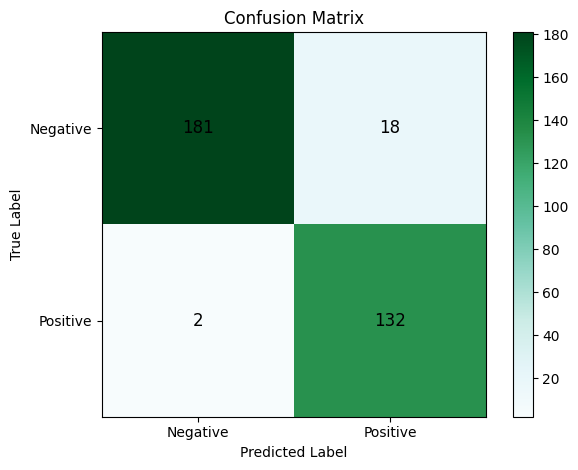

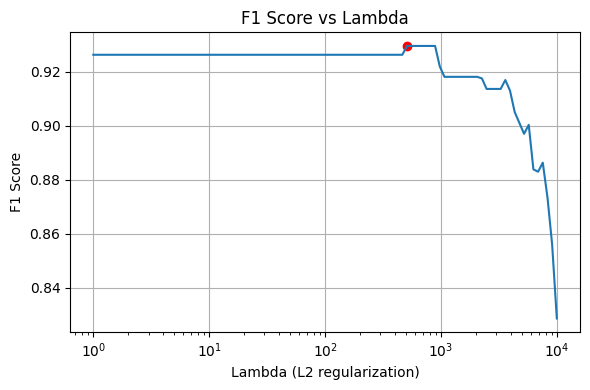

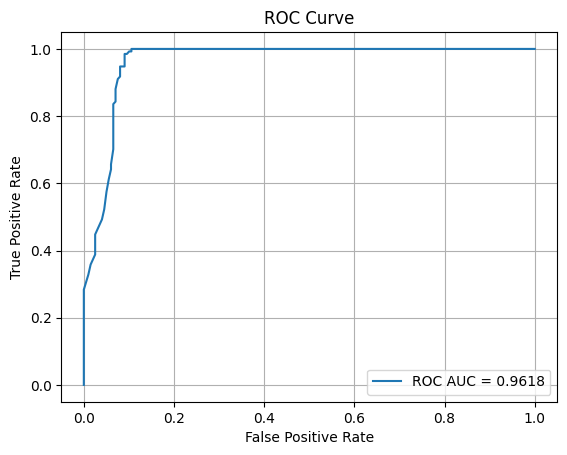

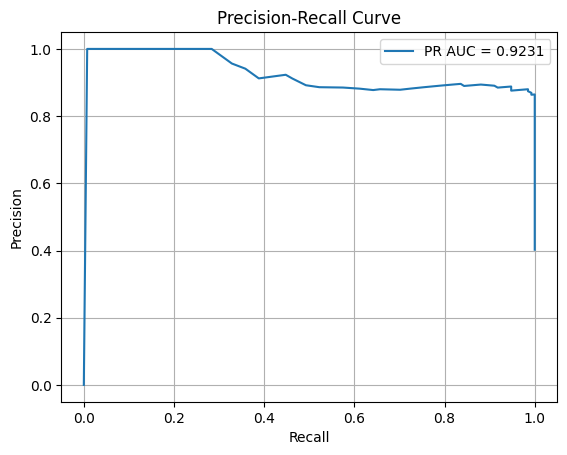

In [37]:
X_train = cell_diagnosis_train_filled_OHE_normalized.drop(columns=[TARGET])
y_train = cell_diagnosis_train_filled_OHE_normalized[TARGET]

X_val = cell_diagnosis_val_filled_OHE_normalized.drop(columns=[TARGET])
y_val = cell_diagnosis_val_filled_OHE_normalized[TARGET]

# Barrido de lambdas
lambda_values = np.logspace(0, 4, 100)
f1_scores = []
models = []

best_f1 = -1
best_lambda = None
best_model = None

for l2 in lambda_values:
    model = LogisticRegression(l2=l2)
    model.fit(X_train, y_train)
    
    y_val_pred = model.predict(X_val)
    score = f1_score(y_val, y_val_pred)
    f1_scores.append(score)
    models.append(model)
    
    if score > best_f1:
        best_f1 = score
        best_lambda = l2
        best_model = model

print(f"Best lambda: {best_lambda:.5f} with F1 Score = {best_f1:.4f}")

# Entrenar modelo final (opcional: ya lo tenés en best_model)
final_model = best_model

# Predicción y métricas
y_pred = final_model.predict(X_val)
y_proba = final_model.predict_proba(X_val)


acc = accuracy(y_val, y_pred)
prec = precision(y_val, y_pred)
rec = recall(y_val, y_pred)
f1 = f1_score(y_val, y_pred)


print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 Score: {f1:.4f}")

plot_conf_matrix(y_val, y_pred)

# Gráfico de lambda vs F1
plt.figure(figsize=(6, 4))
plt.plot(lambda_values, f1_scores)
plt.scatter(best_lambda, best_f1, color='red', label='Best Lambda')
plt.xscale('log')
plt.xlabel("Lambda (L2 regularization)")
plt.ylabel("F1 Score")
plt.title("F1 Score vs Lambda")
plt.grid(True)
plt.tight_layout()
plt.show()

# Curvas ROC y PR
_ = plot_roc_curve(y_val.to_numpy(), y_proba)

_ = plot_pr_curve(y_val.to_numpy(), y_proba)



100%|██████████| 174/174 [00:00<00:00, 712.64it/s]


Test Accuracy: 0.9622
Test Precision: 0.9419
Test Recall: 0.9759
Test F1 Score: 0.9586


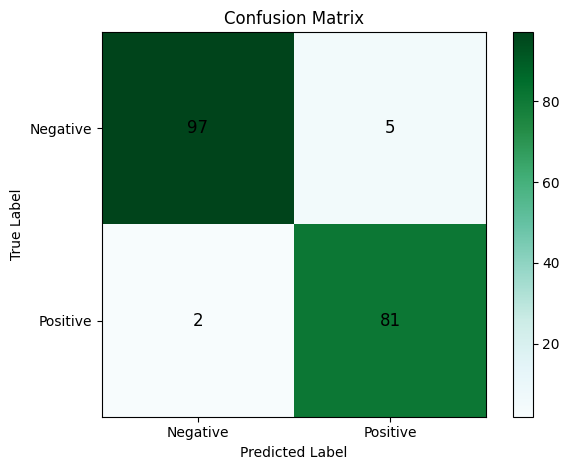

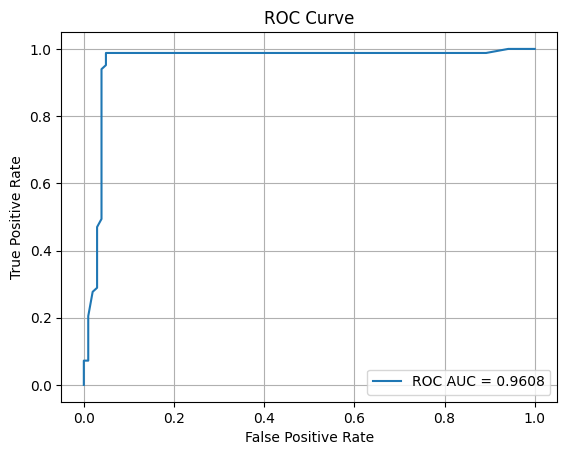

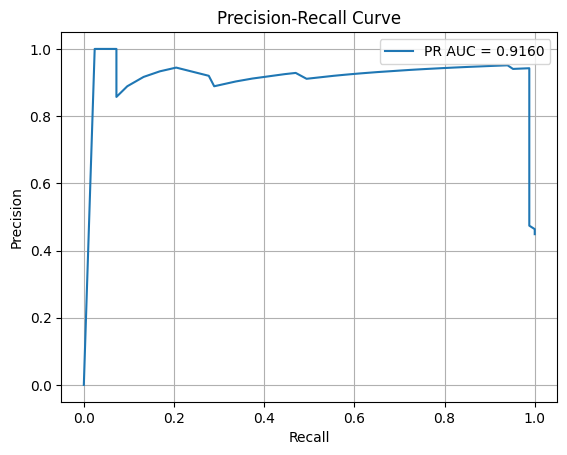

In [27]:
# test the model with the test set
cell_diagnosis_test_df = pd.read_csv('../data/raw/cell_diagnosis_test.csv')

dev_stats = calculate_stats(cell_diagnosis_dev_df)

cell_diagnosis_test_df_filled = handle_missing_values(cell_diagnosis_test_df, true_intervals=TRUE_INTERVALS, train=False, stats=dev_stats, reference_df=cell_diagnosis_dev_df_filled)
cell_diagnosis_test_df_filled_OHE = one_hot_encoding(cell_diagnosis_test_df_filled)

cell_diagnosis_dev_df_filled_OHE_normalized, normalized_dev_stats = normalize_df(cell_diagnosis_dev_df_filled_OHE)

cell_diagnosis_test_df_filled_OHE_normalized, _ = normalize_df(cell_diagnosis_test_df_filled_OHE, train=False, stats=normalized_dev_stats)


# Preparar datos
X_test = cell_diagnosis_test_df_filled_OHE_normalized.drop(columns=[TARGET])
y_test = cell_diagnosis_test_df_filled_OHE_normalized[TARGET]

X_train = cell_diagnosis_dev_df_filled_OHE_normalized.drop(columns=[TARGET])
y_train = cell_diagnosis_dev_df_filled_OHE_normalized[TARGET]

model = LogisticRegression(l2=best_lambda)
model.fit(X_train, y_train)

# Predicción y métricas
y_pred_test = model.predict(X_test)
y_proba_test = model.predict_proba(X_test)

acc_test = accuracy(y_test, y_pred_test)
prec_test = precision(y_test, y_pred_test)
rec_test = recall(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)

print(f"Test Accuracy: {acc_test:.4f}")
print(f"Test Precision: {prec_test:.4f}")
print(f"Test Recall: {rec_test:.4f}")
print(f"Test F1 Score: {f1_test:.4f}")
plot_conf_matrix(y_test, y_pred_test)
_ = plot_roc_curve(y_test.to_numpy(), y_proba_test)
_ = plot_pr_curve(y_test.to_numpy(), y_proba_test)

In [28]:
# do the same for unbalanced data
cell_diagnosis_dev_df_unbalanced = pd.read_csv('../data/raw/cell_diagnosis_dev_imbalanced.csv')
cell_diagnosis_dev_df_unbalanced.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType,GeneticMutation
0,67.663374,0.513293,1.483674,NaN,NaN,0.476990,3.325950,2.449179,58.451676,NaN,5.544034,44.252979,0.0,Epthlial,Absnt
1,-100.000000,0.508854,1.458626,NaN,26.553677,0.499220,3.274258,2.567775,-50.000000,79.573324,5.556110,42.430723,0.0,NaN,Presnt
2,61.101997,0.466692,1.487378,23.033832,26.190955,0.459161,NaN,2.472128,67.187650,78.235757,5.187052,40.741895,0.0,???,Presnt
3,69.867684,0.519679,1.371829,20.910025,27.896494,0.518146,2.736139,2.400920,60.788227,79.562821,5.035683,NaN,1.0,Epthlial,Absnt
4,65.391094,0.489866,1.574212,19.964398,25.472444,0.452596,NaN,2.581605,59.699000,82.807669,5.109881,NaN,0.0,Epthlial,Presnt


In [29]:
# split the data into train and validation sets
cell_diagnosis_train_df_unbalanced, cell_diagnosis_val_df_unbalanced = train_validate_split(cell_diagnosis_dev_df_unbalanced, validation_size=0.2, random_state=RANDOM_STATE)

train_stats_unbalanced = calculate_stats(cell_diagnosis_train_df_unbalanced)

cell_diagnosis_train_filled_unbalanced = handle_missing_values(cell_diagnosis_train_df_unbalanced, true_intervals=TRUE_INTERVALS)
cell_diagnosis_train_filled_OHE_unbalanced = one_hot_encoding(cell_diagnosis_train_filled_unbalanced)
cell_diagnosis_train_filled_OHE_normalized_unbalanced, normalized_train_stats_unbalanced = normalize_df(cell_diagnosis_train_filled_OHE_unbalanced)
cell_diagnosis_train_filled_OHE_normalized_unbalanced.to_csv('../data/processed/cell_diagnosis_train_imbalanced_cleaned.csv', index=False)

cell_diagnosis_val_filled_unbalanced = handle_missing_values(cell_diagnosis_val_df_unbalanced, train=False, stats=train_stats_unbalanced, true_intervals=TRUE_INTERVALS, reference_df=cell_diagnosis_train_filled_unbalanced)
cell_diagnosis_val_filled_OHE_unbalanced = one_hot_encoding(cell_diagnosis_val_filled_unbalanced)
cell_diagnosis_val_filled_OHE_normalized_unbalanced, _ = normalize_df(cell_diagnosis_val_filled_OHE_unbalanced, train=False, stats=normalized_train_stats_unbalanced)
cell_diagnosis_val_filled_OHE_normalized.to_csv('../data/processed/cell_diagnosis_val_imbalanced_cleaned.csv', index=False)

100%|██████████| 233/233 [00:00<00:00, 702.20it/s]


In [30]:
cell_diagnosis_train_filled_OHE_normalized_unbalanced.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,-0.340882,0.596891,0.684606,-0.059765,-0.168323,0.096879,0.532934,0.108427,-0.461544,-0.056977,1.470587,0.757984,0.0,1,0,0
1,-0.039788,0.426978,0.145468,-0.060582,-0.560208,1.080911,0.345827,0.987346,0.024206,-0.523703,1.506696,0.228712,0.0,0,0,1
2,-2.431097,-1.186795,0.764325,1.097112,-0.739974,-0.692314,0.581036,0.278504,2.944002,-1.885274,0.403198,-0.261807,0.0,0,0,1
3,0.361331,0.841329,-1.722688,-1.310883,0.105294,1.918645,-1.601984,-0.249221,0.449314,-0.534394,-0.049402,-0.132214,1.0,1,0,0
4,-1.064747,-0.299782,2.633293,-0.188577,-1.096069,-0.982892,0.862508,1.089841,0.024701,2.768686,0.172453,0.123359,0.0,1,0,1


In [31]:
cell_diagnosis_val_filled_OHE_normalized_unbalanced.head()

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
541,-1.415337,0.390592,0.496369,0.232244,1.448156,0.831220,0.905690,1.430466,1.202951,-0.567181,1.151603,0.254657,0.0,1,0,1
259,1.441746,2.200471,-0.175152,-0.414530,0.566511,0.547348,-1.198359,-0.977604,1.010834,-0.377423,-0.950614,-0.686057,0.0,1,0,1
43,2.730761,-0.921312,-0.498979,1.362168,0.773676,-0.682360,-0.765956,-1.814529,1.314465,0.348591,0.022440,-1.839891,0.0,0,0,1
1008,2.216988,-0.619709,-1.200562,-0.823520,0.533362,1.934773,-1.434223,0.040334,1.578804,0.902628,-0.458126,-0.434222,1.0,1,0,1
584,0.029925,-1.047605,0.846795,-0.378648,0.283306,0.390909,1.313835,1.652516,-0.492115,1.823575,1.112801,1.468208,0.0,1,0,0


Best lambda (unbalanced): 72.20809 with F1 Score = 0.8905
Best lambda (undersampled): 977.00996 with F1 Score = 0.8652
Best lambda (oversampled): 3944.20606 with F1 Score = 0.8714
Best lambda (smote): 890.21509 with F1 Score = 0.8652
Best lambda (cost re weighted): 811.13083 with F1 Score = 0.8652


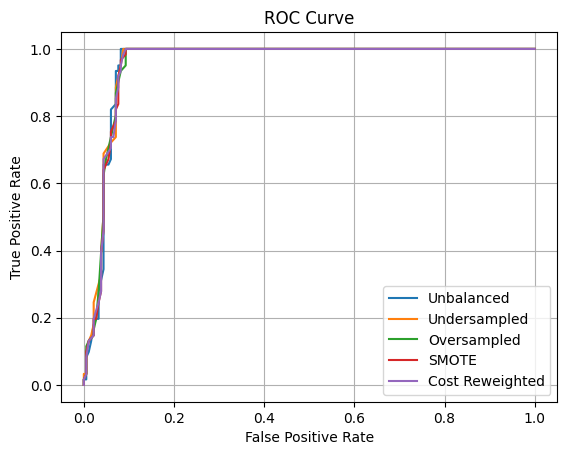

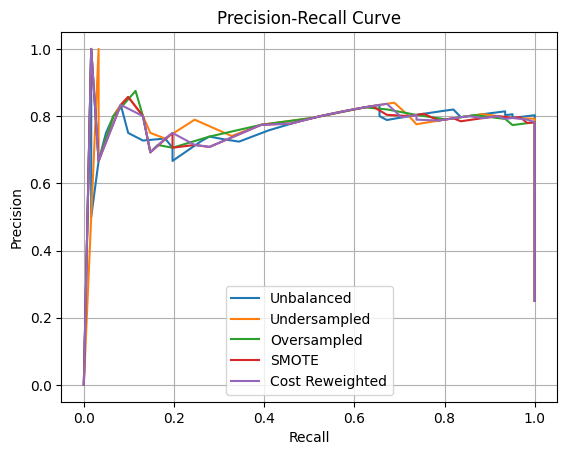

| Modelo                 |   Accuracy |   Precision |   Recall |   F-Score |   AUC-ROC |   AUC-PR |
|:-----------------------|-----------:|------------:|---------:|----------:|----------:|---------:|
| Sin rebalanceo         |      0.939 |       0.803 |        1 |     0.891 |     0.955 |    0.766 |
| Undersampling          |      0.922 |       0.762 |        1 |     0.865 |     0.957 |    0.767 |
| Oversampling duplicate |      0.926 |       0.772 |        1 |     0.871 |     0.956 |    0.765 |
| Oversampling SMOTE     |      0.922 |       0.762 |        1 |     0.865 |     0.955 |    0.77  |
| Cost re-weighting      |      0.922 |       0.762 |        1 |     0.865 |     0.955 |    0.771 |


In [ ]:
# 1 - no rebalancing
# 2 - under sampling
# 3 - over sampling
# 4 - SMOTE
# 5 - cost re weighting

X_train_unbalanced = cell_diagnosis_train_filled_OHE_normalized_unbalanced.drop(columns=[TARGET])
y_train_unbalanced = cell_diagnosis_train_filled_OHE_normalized_unbalanced[TARGET]

X_train_undersampled, y_train_undersampled = undersampling(cell_diagnosis_train_filled_OHE_normalized_unbalanced, random_state=RANDOM_STATE)
X_train_oversampled, y_train_oversampled = oversampling(cell_diagnosis_train_filled_OHE_normalized_unbalanced, random_state=RANDOM_STATE)
X_train_smote, y_train_smote = smote(cell_diagnosis_train_filled_OHE_normalized_unbalanced, k=5, random_state=RANDOM_STATE)

X_val_unbalanced = cell_diagnosis_val_filled_OHE_normalized_unbalanced.drop(columns=[TARGET])
y_val_unbalanced = cell_diagnosis_val_filled_OHE_normalized_unbalanced[TARGET]

# Barrido de lambdas
lambda_values = np.logspace(0, 4, 100)  # de 1e-4 a 1e2
f1_scores_unbalanced = []
f1_scores_undersampled = []
f1_scores_oversampled = []
f1_scores_smote = []
f1_scores_cost_reweighted = []
models_unbalanced = []
models_undersampled = []
models_oversampled = []
models_smote = []
models_cost_reweighted = []

best_f1_unbalanced = -1
best_lambda_unbalanced = None
best_model_unbalanced = None
best_f1_undersampled = -1
best_lambda_undersampled = None
best_model_undersampled = None
best_f1_oversampled = -1
best_lambda_oversampled = None
best_model_oversampled = None
best_f1_smote = -1
best_lambda_smote = None
best_model_smote = None
best_f1_cost_reweighted = -1
best_lambda_cost_reweighted = None
best_model_cost_reweighted = None

for l2 in lambda_values:
    # 1 - no rebalancing
    model_unbalanced = LogisticRegression(l2=l2)
    model_unbalanced.fit(X_train_unbalanced, y_train_unbalanced)
    
    y_val_pred_unbalanced = model_unbalanced.predict(X_val_unbalanced)
    score_unbalanced = f1_score(y_val_unbalanced, y_val_pred_unbalanced)
    f1_scores_unbalanced.append(score_unbalanced)
    models_unbalanced.append(model_unbalanced)
    
    if score_unbalanced > best_f1_unbalanced:
        best_f1_unbalanced = score_unbalanced
        best_lambda_unbalanced = l2
        best_model_unbalanced = model_unbalanced

    # 2 - under sampling
    model_undersampled = LogisticRegression(l2=l2)
    model_undersampled.fit(X_train_undersampled, y_train_undersampled)
    
    y_val_pred_undersampled = model_undersampled.predict(X_val_unbalanced)
    score_undersampled = f1_score(y_val_unbalanced, y_val_pred_undersampled)
    f1_scores_undersampled.append(score_undersampled)
    models_undersampled.append(model_undersampled)
    
    if score_undersampled > best_f1_undersampled:
        best_f1_undersampled = score_undersampled
        best_lambda_undersampled = l2
        best_model_undersampled = model_undersampled

    # 3 - over sampling
    model_oversampled = LogisticRegression(l2=l2)
    model_oversampled.fit(X_train_oversampled, y_train_oversampled)
    
    y_val_pred_oversampled = model_oversampled.predict(X_val_unbalanced)
    score_oversampled = f1_score(y_val_unbalanced, y_val_pred_oversampled)
    f1_scores_oversampled.append(score_oversampled)
    models_oversampled.append(model_oversampled)

    if score_oversampled > best_f1_oversampled:
        best_f1_oversampled = score_oversampled
        best_lambda_oversampled = l2
        best_model_oversampled = model_oversampled

    # 4 - SMOTE
    model_smote = LogisticRegression(l2=l2)
    model_smote.fit(X_train_smote, y_train_smote)

    y_val_pred_smote = model_smote.predict(X_val_unbalanced)
    score_smote = f1_score(y_val_unbalanced, y_val_pred_smote)
    f1_scores_smote.append(score_smote)
    models_smote.append(model_smote)

    if score_smote > best_f1_smote:
        best_f1_smote = score_smote
        best_lambda_smote = l2
        best_model_smote = model_smote

    # 5 - cost re weighting
    model_cost_reweighted = LogisticRegression(l2=l2, cost_re_weighting=True)
    model_cost_reweighted.fit(X_train_unbalanced, y_train_unbalanced)

    y_val_pred_cost_reweighted = model_cost_reweighted.predict(X_val_unbalanced)
    score_cost_reweighted = f1_score(y_val_unbalanced, y_val_pred_cost_reweighted)
    f1_scores_cost_reweighted.append(score_cost_reweighted)
    models_cost_reweighted.append(model_cost_reweighted)

    if score_cost_reweighted > best_f1_cost_reweighted:
        best_f1_cost_reweighted = score_cost_reweighted
        best_lambda_cost_reweighted = l2
        best_model_cost_reweighted = model_cost_reweighted

# calculate the metrics for the best models
print(f"Best lambda (unbalanced): {best_lambda_unbalanced:.5f} with F1 Score = {best_f1_unbalanced:.4f}")
print(f"Best lambda (undersampled): {best_lambda_undersampled:.5f} with F1 Score = {best_f1_undersampled:.4f}")
print(f"Best lambda (oversampled): {best_lambda_oversampled:.5f} with F1 Score = {best_f1_oversampled:.4f}")
print(f"Best lambda (smote): {best_lambda_smote:.5f} with F1 Score = {best_f1_smote:.4f}")
print(f"Best lambda (cost re weighted): {best_lambda_cost_reweighted:.5f} with F1 Score = {best_f1_cost_reweighted:.4f}")

acc_unbalanced = accuracy(y_val_unbalanced, best_model_unbalanced.predict(X_val_unbalanced))
prec_unbalanced = precision(y_val_unbalanced, best_model_unbalanced.predict(X_val_unbalanced))
rec_unbalanced = recall(y_val_unbalanced, best_model_unbalanced.predict(X_val_unbalanced))
f1_unbalanced = f1_score(y_val_unbalanced, best_model_unbalanced.predict(X_val_unbalanced))

acc_undersampled = accuracy(y_val_unbalanced, best_model_undersampled.predict(X_val_unbalanced))
prec_undersampled = precision(y_val_unbalanced, best_model_undersampled.predict(X_val_unbalanced))
rec_undersampled = recall(y_val_unbalanced, best_model_undersampled.predict(X_val_unbalanced))
f1_undersampled = f1_score(y_val_unbalanced, best_model_undersampled.predict(X_val_unbalanced))

acc_oversampled = accuracy(y_val_unbalanced, best_model_oversampled.predict(X_val_unbalanced))
prec_oversampled = precision(y_val_unbalanced, best_model_oversampled.predict(X_val_unbalanced))
rec_oversampled = recall(y_val_unbalanced, best_model_oversampled.predict(X_val_unbalanced))
f1_oversampled = f1_score(y_val_unbalanced, best_model_oversampled.predict(X_val_unbalanced))

acc_smote = accuracy(y_val_unbalanced, best_model_smote.predict(X_val_unbalanced))
prec_smote = precision(y_val_unbalanced, best_model_smote.predict(X_val_unbalanced))
rec_smote = recall(y_val_unbalanced, best_model_smote.predict(X_val_unbalanced))
f1_smote = f1_score(y_val_unbalanced, best_model_smote.predict(X_val_unbalanced))

acc_cost_reweighted = accuracy(y_val_unbalanced, best_model_cost_reweighted.predict(X_val_unbalanced))
prec_cost_reweighted = precision(y_val_unbalanced, best_model_cost_reweighted.predict(X_val_unbalanced))
rec_cost_reweighted = recall(y_val_unbalanced, best_model_cost_reweighted.predict(X_val_unbalanced))
f1_cost_reweighted = f1_score(y_val_unbalanced, best_model_cost_reweighted.predict(X_val_unbalanced))

auc_roc_unbalanced = plot_roc_curve(y_val_unbalanced.to_numpy(), best_model_unbalanced.predict_proba(X_val_unbalanced), show=False, label='Unbalanced')
auc_roc_undersampled = plot_roc_curve(y_val_unbalanced.to_numpy(), best_model_undersampled.predict_proba(X_val_unbalanced), show=False, label='Undersampled')
auc_roc_oversampled = plot_roc_curve(y_val_unbalanced.to_numpy(), best_model_oversampled.predict_proba(X_val_unbalanced), show=False, label='Oversampled')
auc_roc_smote = plot_roc_curve(y_val_unbalanced.to_numpy(), best_model_smote.predict_proba(X_val_unbalanced), show=False, label='SMOTE')
auc_roc_cost_reweighted = plot_roc_curve(y_val_unbalanced.to_numpy(), best_model_cost_reweighted.predict_proba(X_val_unbalanced), show=False, label='Cost Reweighted')

plt.show()

auc_pr_unbalanced = plot_pr_curve(y_val_unbalanced.to_numpy(), best_model_unbalanced.predict_proba(X_val_unbalanced), show=False, label='Unbalanced')
auc_pr_undersampled = plot_pr_curve(y_val_unbalanced.to_numpy(), best_model_undersampled.predict_proba(X_val_unbalanced), show=False, label='Undersampled')
auc_pr_oversampled = plot_pr_curve(y_val_unbalanced.to_numpy(), best_model_oversampled.predict_proba(X_val_unbalanced), show=False, label='Oversampled')
auc_pr_smote = plot_pr_curve(y_val_unbalanced.to_numpy(), best_model_smote.predict_proba(X_val_unbalanced), show=False, label='SMOTE')
auc_pr_cost_reweighted = plot_pr_curve(y_val_unbalanced.to_numpy(), best_model_cost_reweighted.predict_proba(X_val_unbalanced), show=False, label='Cost Reweighted')

plt.show()


results = {
    "Modelo": [
        "Sin rebalanceo",
        "Undersampling",
        "Oversampling duplicate",
        "Oversampling SMOTE",
        "Cost re-weighting"
    ],
    "Accuracy": [
        acc_unbalanced,
        acc_undersampled,
        acc_oversampled,
        acc_smote,
        acc_cost_reweighted
    ],
    "Precision": [
        prec_unbalanced,
        prec_undersampled,
        prec_oversampled,
        prec_smote,
        prec_cost_reweighted
    ],
    "Recall": [
        rec_unbalanced,
        rec_undersampled,
        rec_oversampled,
        rec_smote,
        rec_cost_reweighted
    ],
    "F-Score": [
        f1_unbalanced,
        f1_undersampled,
        f1_oversampled,
        f1_smote,
        f1_cost_reweighted
    ],
    "AUC-ROC": [
        auc_roc_unbalanced,
        auc_roc_undersampled,
        auc_roc_oversampled,
        auc_roc_smote,
        auc_roc_cost_reweighted
    ],
    "AUC-PR": [
        auc_pr_unbalanced,
        auc_pr_undersampled,
        auc_pr_oversampled,
        auc_pr_smote,
        auc_pr_cost_reweighted
    ]
}

df_results = pd.DataFrame(results)

# Round for pretty formatting
df_results_rounded = df_results.copy()
df_results_rounded.iloc[:, 1:] = df_results_rounded.iloc[:, 1:].round(3)

# Print as Markdown
print(df_results_rounded.to_markdown(index=False))

100%|██████████| 128/128 [00:00<00:00, 853.37it/s]


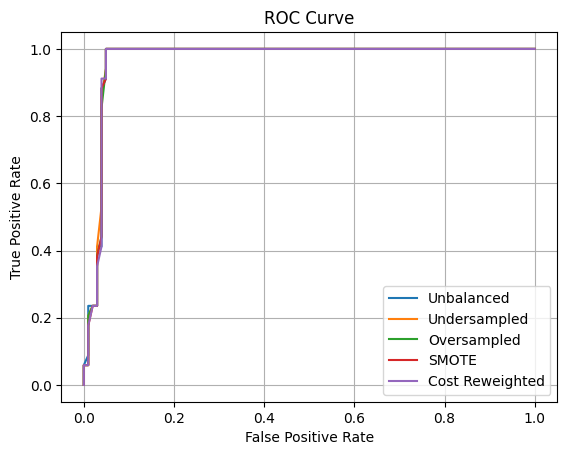

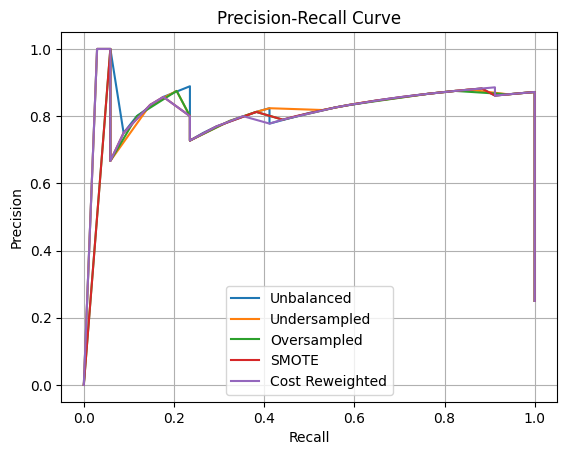

| Modelo                 |   Accuracy |   Precision |   Recall |   F-Score |   AUC-ROC |   AUC-PR |
|:-----------------------|-----------:|------------:|---------:|----------:|----------:|---------:|
| Sin rebalanceo         |      0.956 |       0.868 |    0.971 |     0.917 |     0.971 |    0.819 |
| Undersampling          |      0.956 |       0.85  |    1     |     0.919 |     0.97  |    0.825 |
| Oversampling duplicate |      0.956 |       0.85  |    1     |     0.919 |     0.968 |    0.797 |
| Oversampling SMOTE     |      0.956 |       0.85  |    1     |     0.919 |     0.97  |    0.803 |
| Cost re-weighting      |      0.956 |       0.85  |    1     |     0.919 |     0.969 |    0.815 |


In [39]:
# do the same for the test set
cell_diagnosis_test_df_unbalanced = pd.read_csv('../data/raw/cell_diagnosis_test_imbalanced.csv')

cell_diagnosis_dev_df_unbalanced_filled = handle_missing_values(cell_diagnosis_dev_df_unbalanced, true_intervals=TRUE_INTERVALS)
cell_diagnosis_dev_df_unbalanced_filled_OHE = one_hot_encoding(cell_diagnosis_dev_df_unbalanced_filled)
cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized, normalized_dev_stats_unbalanced = normalize_df(cell_diagnosis_dev_df_unbalanced_filled_OHE)

dev_stats_unbalanced = calculate_stats(cell_diagnosis_dev_df_unbalanced)

cell_diagnosis_test_df_unbalanced_filled = handle_missing_values(cell_diagnosis_test_df_unbalanced, true_intervals=TRUE_INTERVALS, train=False, stats=dev_stats_unbalanced, reference_df=cell_diagnosis_dev_df_unbalanced_filled)
cell_diagnosis_test_df_unbalanced_filled_OHE = one_hot_encoding(cell_diagnosis_test_df_unbalanced_filled)
cell_diagnosis_test_df_unbalanced_filled_OHE_normalized, _ = normalize_df(cell_diagnosis_test_df_unbalanced_filled_OHE, train=False, stats=normalized_dev_stats_unbalanced)

# Preparar datos
X_test_unbalanced = cell_diagnosis_test_df_unbalanced_filled_OHE_normalized.drop(columns=[TARGET])
y_test_unbalanced = cell_diagnosis_test_df_unbalanced_filled_OHE_normalized[TARGET]

X_train_unbalanced, y_train_unbalanced = cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized.drop(columns=[TARGET]), cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized[TARGET]
X_train_undersampled, y_train_undersampled = undersampling(cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized, random_state=RANDOM_STATE)
X_train_oversampled, y_train_oversampled = oversampling(cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized, random_state=RANDOM_STATE)
X_train_smote, y_train_smote = smote(cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized, k=5, random_state=RANDOM_STATE)
X_train_cost_reweighted, y_train_cost_reweighted = cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized.drop(columns=[TARGET]), cell_diagnosis_dev_df_unbalanced_filled_OHE_normalized[TARGET]

# train the models with the dev set
model_unbalanced = LogisticRegression(l2=best_lambda_unbalanced)
model_unbalanced.fit(X_train_unbalanced, y_train_unbalanced)

model_undersampled = LogisticRegression(l2=best_lambda_undersampled)
model_undersampled.fit(X_train_undersampled, y_train_undersampled)

model_oversampled = LogisticRegression(l2=best_lambda_oversampled)
model_oversampled.fit(X_train_oversampled, y_train_oversampled)

model_smote = LogisticRegression(l2=best_lambda_smote)
model_smote.fit(X_train_smote, y_train_smote)

model_cost_reweighted = LogisticRegression(l2=best_lambda_cost_reweighted, cost_re_weighting=True)
model_cost_reweighted.fit(X_train_cost_reweighted, y_train_cost_reweighted)

# Predicción y métricas
y_pred_test_unbalanced = model_unbalanced.predict(X_test_unbalanced)
y_proba_test_unbalanced = model_unbalanced.predict_proba(X_test_unbalanced)

y_pred_test_undersampled = model_undersampled.predict(X_test_unbalanced)
y_proba_test_undersampled = model_undersampled.predict_proba(X_test_unbalanced)

y_pred_test_oversampled = model_oversampled.predict(X_test_unbalanced)
y_proba_test_oversampled = model_oversampled.predict_proba(X_test_unbalanced)

y_pred_test_smote = model_smote.predict(X_test_unbalanced)
y_proba_test_smote = model_smote.predict_proba(X_test_unbalanced)

y_pred_test_cost_reweighted = model_cost_reweighted.predict(X_test_unbalanced)
y_proba_test_cost_reweighted = model_cost_reweighted.predict_proba(X_test_unbalanced)

acc_test_unbalanced = accuracy(y_test_unbalanced, y_pred_test_unbalanced)
prec_test_unbalanced = precision(y_test_unbalanced, y_pred_test_unbalanced)
rec_test_unbalanced = recall(y_test_unbalanced, y_pred_test_unbalanced)
f1_test_unbalanced = f1_score(y_test_unbalanced, y_pred_test_unbalanced)

acc_test_undersampled = accuracy(y_test_unbalanced, y_pred_test_undersampled)
prec_test_undersampled = precision(y_test_unbalanced, y_pred_test_undersampled)
rec_test_undersampled = recall(y_test_unbalanced, y_pred_test_undersampled)
f1_test_undersampled = f1_score(y_test_unbalanced, y_pred_test_undersampled)

acc_test_oversampled = accuracy(y_test_unbalanced, y_pred_test_oversampled)
prec_test_oversampled = precision(y_test_unbalanced, y_pred_test_oversampled)
rec_test_oversampled = recall(y_test_unbalanced, y_pred_test_oversampled)
f1_test_oversampled = f1_score(y_test_unbalanced, y_pred_test_oversampled)

acc_test_smote = accuracy(y_test_unbalanced, y_pred_test_smote)
prec_test_smote = precision(y_test_unbalanced, y_pred_test_smote)
rec_test_smote = recall(y_test_unbalanced, y_pred_test_smote)
f1_test_smote = f1_score(y_test_unbalanced, y_pred_test_smote)

acc_test_cost_reweighted = accuracy(y_test_unbalanced, y_pred_test_cost_reweighted)
prec_test_cost_reweighted = precision(y_test_unbalanced, y_pred_test_cost_reweighted)
rec_test_cost_reweighted = recall(y_test_unbalanced, y_pred_test_cost_reweighted)
f1_test_cost_reweighted = f1_score(y_test_unbalanced, y_pred_test_cost_reweighted)

auc_roc_test_unbalanced = plot_roc_curve(y_test_unbalanced.to_numpy(), y_proba_test_unbalanced, show=False, label='Unbalanced')
auc_roc_test_undersampled = plot_roc_curve(y_test_unbalanced.to_numpy(), y_proba_test_undersampled, show=False, label='Undersampled')
auc_roc_test_oversampled = plot_roc_curve(y_test_unbalanced.to_numpy(), y_proba_test_oversampled, show=False, label='Oversampled')
auc_roc_test_smote = plot_roc_curve(y_test_unbalanced.to_numpy(), y_proba_test_smote, show=False, label='SMOTE')
auc_roc_test_cost_reweighted = plot_roc_curve(y_test_unbalanced.to_numpy(), y_proba_test_cost_reweighted, show=False, label='Cost Reweighted')

plt.show()

auc_pr_test_unbalanced = plot_pr_curve(y_test_unbalanced.to_numpy(), y_proba_test_unbalanced, show=False, label='Unbalanced')
auc_pr_test_undersampled = plot_pr_curve(y_test_unbalanced.to_numpy(), y_proba_test_undersampled, show=False, label='Undersampled')
auc_pr_test_oversampled = plot_pr_curve(y_test_unbalanced.to_numpy(), y_proba_test_oversampled, show=False, label='Oversampled')
auc_pr_test_smote = plot_pr_curve(y_test_unbalanced.to_numpy(), y_proba_test_smote, show=False, label='SMOTE')
auc_pr_test_cost_reweighted = plot_pr_curve(y_test_unbalanced.to_numpy(), y_proba_test_cost_reweighted, show=False, label='Cost Reweighted')

plt.show()

results_test = {
    "Modelo": [
        "Sin rebalanceo",
        "Undersampling",
        "Oversampling duplicate",
        "Oversampling SMOTE",
        "Cost re-weighting"
    ],
    "Accuracy": [
        acc_test_unbalanced,
        acc_test_undersampled,
        acc_test_oversampled,
        acc_test_smote,
        acc_test_cost_reweighted
    ],
    "Precision": [
        prec_test_unbalanced,
        prec_test_undersampled,
        prec_test_oversampled,
        prec_test_smote,
        prec_test_cost_reweighted
    ],
    "Recall": [
        rec_test_unbalanced,
        rec_test_undersampled,
        rec_test_oversampled,
        rec_test_smote,
        rec_test_cost_reweighted
    ],
    "F-Score": [
        f1_test_unbalanced,
        f1_test_undersampled,
        f1_test_oversampled,
        f1_test_smote,
        f1_test_cost_reweighted
    ],
    "AUC-ROC": [
        auc_roc_test_unbalanced,
        auc_roc_test_undersampled,
        auc_roc_test_oversampled,
        auc_roc_test_smote,
        auc_roc_test_cost_reweighted
    ],
    "AUC-PR": [
        auc_pr_test_unbalanced,
        auc_pr_test_undersampled,
        auc_pr_test_oversampled,
        auc_pr_test_smote,
        auc_pr_test_cost_reweighted
    ]
}

df_results_test = pd.DataFrame(results_test)

# Round for pretty formatting
df_results_test_rounded = df_results_test.copy()
df_results_test_rounded.iloc[:, 1:] = df_results_test_rounded.iloc[:, 1:].round(3)

# Print as Markdown
print(df_results_test_rounded.to_markdown(index=False))